
# Double Inverted Pendulum (2-Link) — PID Control (Jupyter Notebook)

このノートブックでは、二重振り子（2リンク・平面・各関節トルク制御）を **PID制御** で倒立（上向き）へ安定化するまでを扱う。  
**構成**:
1. 物理パラメータと運動方程式（2リンク・平面）
2. ベクトル対応のPIDクラス（積分アンチワインドアップ、微分フィルタ）
3. RK4による数値積分
4. ランダム初期条件からの倒立安定化シミュレーション
5. 可視化（時系列、位相図、終端誤差分布）
6. （任意）簡易アニメーション

> 注: 教育・検証用モデル。実機制御や厳密なロバスト解析は範囲外。


In [1]:

# %% [Setup]
import numpy as np
import math
import matplotlib.pyplot as plt
from dataclasses import dataclass

# matplotlib settings
plt.rcParams["figure.figsize"] = (6.4, 4.2)
plt.rcParams["figure.dpi"] = 140

def wrap_pi(a):
    """Wrap angle to (-pi, pi]."""
    return (a + np.pi) % (2*np.pi) - np.pi



## 1) 物理パラメータと2リンク運動方程式

- 各リンクは剛体棒（長さ `l1, l2`、質量 `m1, m2`）
- 関節トルク `u = [u1, u2]` を加える（両関節アクチュエート）
- 重力 `g`、粘性摩擦 `b1, b2` を含む
- 状態: `x = [th1, th2, dth1, dth2]`（角度は反時計回り正）
- 倒立目標: `th1 = 0, th2 = 0`


In [2]:

# %% [Dynamics]
@dataclass
class Params:
    m1: float = 0.8
    m2: float = 0.6
    l1: float = 0.45
    l2: float = 0.35
    lc1: float = 0.45/2
    lc2: float = 0.35/2
    I1: float = 0.8*(0.45**2)/12
    I2: float = 0.6*(0.35**2)/12
    b1: float = 0.04
    b2: float = 0.03
    g: float = 9.81

P = Params()

def dynamics(x, u, P=P):
    th1, th2, dth1, dth2 = x
    u1, u2 = u
    m1, m2 = P.m1, P.m2
    l1, l2 = P.l1, P.l2
    lc1, lc2 = P.lc1, P.lc2
    I1, I2 = P.I1, P.I2
    b1, b2 = P.b1, P.b2
    g = P.g

    c2 = math.cos(th2); s2 = math.sin(th2)

    M11 = I1 + I2 + m2*(l1**2) + 2*m2*l1*lc2*c2 + m1*(lc1**2) + m2*(lc2**2)
    M12 = I2 + m2*l1*lc2*c2 + m2*(lc2**2)
    M21 = M12
    M22 = I2 + m2*(lc2**2)

    h = -m2*l1*lc2*s2
    C1 = h*(2*dth1*dth2 + dth2**2) + b1*dth1
    C2 = h*(dth1**2)               + b2*dth2

    G1 = (m1*lc1 + m2*l1)*g*math.sin(th1) + m2*lc2*g*math.sin(th1+th2)
    G2 = m2*lc2*g*math.sin(th1+th2)

    det = M11*M22 - M12*M21
    invM11 =  M22/det; invM12 = -M12/det
    invM21 = -M21/det; invM22 =  M11/det

    tau1 = u1 - C1 - G1
    tau2 = u2 - C2 - G2

    ddth1 = invM11*tau1 + invM12*tau2
    ddth2 = invM21*tau1 + invM22*tau2

    return np.array([dth1, dth2, ddth1, ddth2], dtype=float)



## 2) ベクトル版 PID コントローラ（アンチワインドアップ / 微分フィルタ）


In [3]:

# %% [Controller]
class PIDController:
    def __init__(self, Kp, Ki, Kd, dt, umin=-np.inf, umax=np.inf, tau_d=0.02):
        self.dt = float(dt)
        self.Kp = np.diag(Kp) if np.ndim(Kp)==1 else np.array(Kp, float)
        self.Ki = np.diag(Ki) if np.ndim(Ki)==1 else np.array(Ki, float)
        self.Kd = np.diag(Kd) if np.ndim(Kd)==1 else np.array(Kd, float)
        self.umin = np.array(umin if np.ndim(umin)>0 else [umin, umin], float)
        self.umax = np.array(umax if np.ndim(umax)>0 else [umax, umax], float)
        self.integral = np.zeros(2, dtype=float)
        self.d_err_filt = np.zeros(2, dtype=float)
        self.tau_d = float(tau_d)

    def reset(self):
        self.integral[:] = 0.0
        self.d_err_filt[:] = 0.0

    def step(self, x, x_ref):
        th  = np.array([x[0], x[1]])
        dth = np.array([x[2], x[3]])
        th_ref  = np.array([x_ref[0], x_ref[1]])
        dth_ref = np.array([x_ref[2], x_ref[3]])

        e_th  = wrap_pi(th_ref - th)
        e_dth = dth_ref - dth

        # derivative (filtered)
        d_e_raw = e_dth
        if self.tau_d > 1e-8:
            alpha = self.dt / (self.tau_d + self.dt)
            self.d_err_filt += alpha * (d_e_raw - self.d_err_filt)
            d_e = self.d_err_filt
        else:
            d_e = d_e_raw

        integ_new = self.integral + e_th * self.dt
        u = self.Kp @ e_th + self.Ki @ integ_new + self.Kd @ d_e
        u_sat = np.clip(u, self.umin, self.umax)
        mask_sat = (np.abs(u - u_sat) > 1e-12)
        for i in range(2):
            if not mask_sat[i]:
                self.integral[i] = integ_new[i]
        return u_sat



## 3) RK4 とシミュレーション関数


In [4]:

# %% [Integration / Simulation]
def rk4_step(f, x, u, dt):
    k1 = f(x, u)
    k2 = f(x + 0.5*dt*k1, u)
    k3 = f(x + 0.5*dt*k2, u)
    k4 = f(x + dt*k3, u)
    return x + (dt/6.0)*(k1 + 2*k2 + 2*k3 + k4)

def simulate(T=6.0, dt=0.002, controller=None, x0=None, u_limits=3.0, P=None):
    if P is None:
        from math import isnan  # dummy
    nsteps = int(np.round(T/dt))
    t = np.linspace(0, T, nsteps+1)
    if x0 is None:
        th0  = np.deg2rad(np.random.uniform(-15, 15, size=2))
        dth0 = np.deg2rad(np.random.uniform(-30, 30, size=2))
        x = np.array([th0[0], th0[1], dth0[0], dth0[1]], float)
    else:
        x = np.array(x0, float)
    xh = np.zeros((nsteps+1, 4), float)
    uh = np.zeros((nsteps+1, 2), float)
    xh[0] = x
    umax = u_limits if np.ndim(u_limits)>0 else [u_limits, u_limits]
    if controller is None:
        controller = PIDController(Kp=[30, 20], Ki=[12, 8], Kd=[2.0, 1.2], dt=dt, umin=-np.array(umax), umax=np.array(umax))
    controller.reset()
    x_ref = np.zeros(4, dtype=float)
    for k in range(nsteps):
        u = controller.step(x, x_ref)
        uh[k] = u
        x = rk4_step(dynamics, x, u, dt)
        x[0] = wrap_pi(x[0]); x[1] = wrap_pi(x[1])
        xh[k+1] = x; uh[k+1] = u
    return t, xh, uh



## 4) 単一ケースのデモ（時系列 / 位相図）


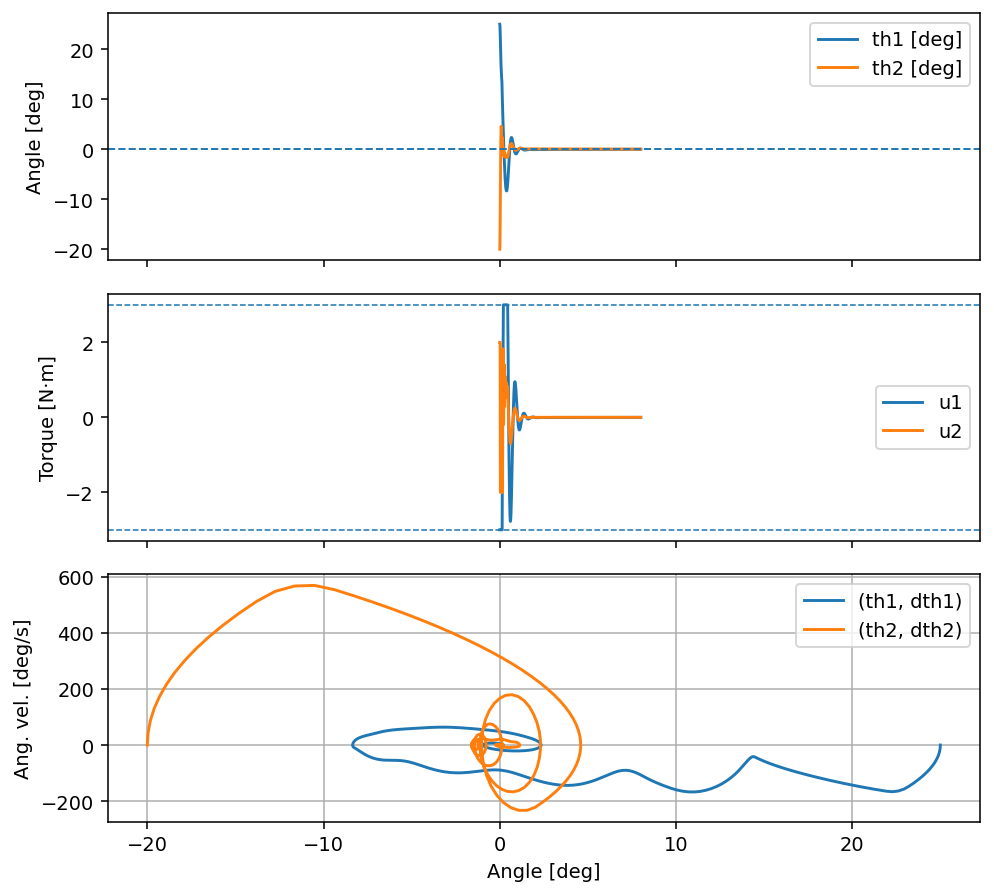

In [5]:

# %% [Demo]
np.random.seed(42)
dt = 0.002
ctl = PIDController(
    Kp=[35, 25],
    Ki=[10, 8],
    Kd=[2.5, 1.5],
    dt=dt,
    umin=[-3.0, -2.0],
    umax=[ 3.0,  2.0],
    tau_d=0.03,
)
x0 = [np.deg2rad(25), np.deg2rad(-20), 0.0, 0.0]
t, xh, uh = simulate(T=8.0, dt=dt, controller=ctl, x0=x0, u_limits=[3.0, 2.0])

th1, th2, dth1, dth2 = xh.T
fig, axs = plt.subplots(3, 1, figsize=(7.2, 6.5), sharex=True)
axs[0].plot(t, np.rad2deg(th1), label="th1 [deg]")
axs[0].plot(t, np.rad2deg(th2), label="th2 [deg]")
axs[0].axhline(0, ls="--", lw=1)
axs[0].set_ylabel("Angle [deg]"); axs[0].legend()

axs[1].plot(t, uh[:,0], label="u1")
axs[1].plot(t, uh[:,1], label="u2")
axs[1].axhline( 3.0, ls="--", lw=0.8)
axs[1].axhline(-3.0, ls="--", lw=0.8)
axs[1].set_ylabel("Torque [N·m]"); axs[1].legend()

axs[2].plot(np.rad2deg(th1), np.rad2deg(dth1), label="(th1, dth1)")
axs[2].plot(np.rad2deg(th2), np.rad2deg(dth2), label="(th2, dth2)")
axs[2].set_xlabel("Angle [deg]"); axs[2].set_ylabel("Ang. vel. [deg/s]"); axs[2].legend(); axs[2].grid(True)

plt.tight_layout(); plt.show()



## 5) ランダム初期条件スイープ（安定化領域の感触）


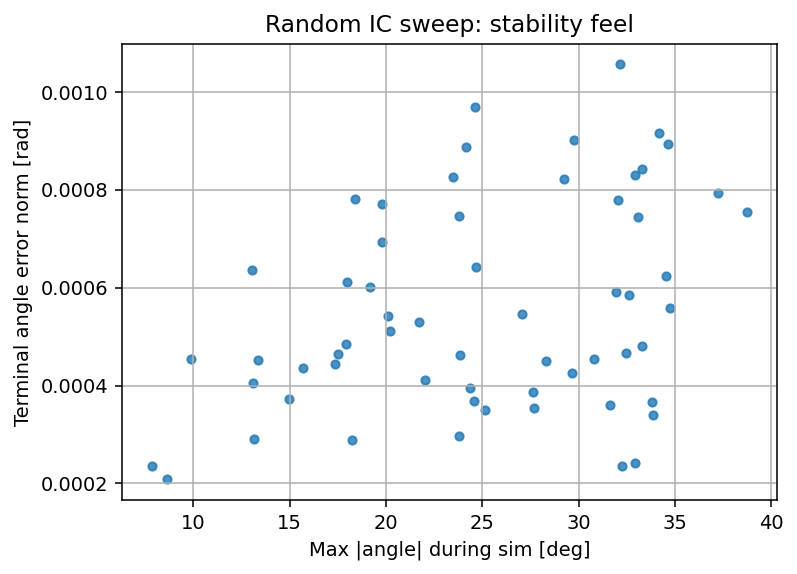

Median terminal angle error: 0.0005 rad
90th percentile terminal angle error: 0.0008 rad


In [6]:

# %% [Sweep]
def run_sweep(n=40, seed=0):
    rng = np.random.default_rng(seed)
    results = []
    dt = 0.002
    ctl = PIDController(
        Kp=[35, 25],
        Ki=[10, 8],
        Kd=[2.5, 1.5],
        dt=dt,
        umin=[-3.0, -2.0],
        umax=[ 3.0,  2.0],
        tau_d=0.03,
    )
    for i in range(n):
        th0  = np.deg2rad(rng.uniform(-35, 35, size=2))
        dth0 = np.deg2rad(rng.uniform(-120, 120, size=2))
        x0 = [th0[0], th0[1], dth0[0], dth0[1]]
        t, xh, uh = simulate(T=6.0, dt=dt, controller=ctl, x0=x0, u_limits=[3.0, 2.0])
        th_err = np.linalg.norm(wrap_pi(xh[-1,:2] - 0.0))
        max_dev = np.max(np.abs(np.rad2deg(xh[:,:2])))
        results.append((th_err, max_dev))
    return np.array(results)

res = run_sweep(n=60, seed=1)
th_err = res[:,0]; max_dev = res[:,1]

fig, ax = plt.subplots(1,1, figsize=(5.8,4.2))
ax.scatter(max_dev, th_err, s=18, alpha=0.8)
ax.set_xlabel("Max |angle| during sim [deg]")
ax.set_ylabel("Terminal angle error norm [rad]")
ax.set_title("Random IC sweep: stability feel")
ax.grid(True); plt.tight_layout(); plt.show()

print(f"Median terminal angle error: {np.median(th_err):.4f} rad")
print(f"90th percentile terminal angle error: {np.percentile(th_err, 90):.4f} rad")



## 6) （任意）簡易アニメーション


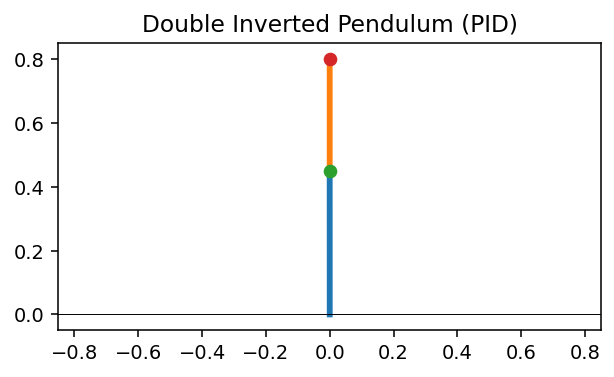

In [7]:

# %% [Animation - optional]
try:
    import matplotlib.animation as animation
    from IPython.display import HTML
    HAS_ANIM = True
except Exception as e:
    print("Animation deps missing; skipping:", e)
    HAS_ANIM = False

if HAS_ANIM:
    dt = 0.002
    ctl = PIDController(Kp=[35, 25], Ki=[10, 8], Kd=[2.5, 1.5], dt=dt, umin=[-3.0, -2.0], umax=[3.0, 2.0], tau_d=0.03)
    x0 = [np.deg2rad(20), np.deg2rad(-15), 0.0, 0.0]
    t, xh, uh = simulate(T=6.0, dt=dt, controller=ctl, x0=x0, u_limits=[3.0, 2.0])
    from math import sin, cos

    l1, l2 = 0.45, 0.35
    th1 = xh[:,0]; th2 = xh[:,1]
    x1 = l1*np.sin(th1); y1 = l1*np.cos(th1)
    x2 = x1 + l2*np.sin(th1+th2); y2 = y1 + l2*np.cos(th1+th2)

    fig, ax = plt.subplots(figsize=(5,5))
    ax.set_aspect('equal', 'box')
    L = l1 + l2 + 0.05
    ax.set_xlim(-L, L); ax.set_ylim(-0.05, L)
    ln1, = ax.plot([], [], lw=3); ln2, = ax.plot([], [], lw=3)
    bob1, = ax.plot([], [], 'o'); bob2, = ax.plot([], [], 'o')
    ax.axhline(0, color='k', lw=0.5); ax.set_title("Double Inverted Pendulum (PID)")

    def init():
        ln1.set_data([], []); ln2.set_data([], [])
        bob1.set_data([], []); bob2.set_data([], [])
        return ln1, ln2, bob1, bob2

    def update(i):
        ln1.set_data([0, x1[i]], [0, y1[i]])
        ln2.set_data([x1[i], x2[i]], [y1[i], y2[i]])
        bob1.set_data([x1[i]], [y1[i]]); bob2.set_data([x2[i]], [y2[i]])
        return ln1, ln2, bob1, bob2

    frames = np.arange(0, len(t), 5)
    ani = animation.FuncAnimation(fig, update, frames=frames, init_func=init, blit=True, interval=1000*(t[1]-t[0])*5)
    display(HTML(ani.to_jshtml()))



## 7) チューニングの指針
- まず `Kp` を上げ、次に発散/振動を見ながら `Kd` を調整。
- 定常偏差が残る場合のみ `Ki` を少量追加。飽和が起きるならアンチワインドアップ必須。
- 角度誤差は `wrap_pi` で最近傍をとること。
- トルク上限と摩擦は現実的な値を想定して設定すること。
